# Exploration of the shipfix data

In [35]:
fdir = '/home/jovyan/persistent//data/shipfix'
!ls -alrth {fdir}

fdir_export = '/home/jovyan/persistent//data/shipfix/export_data'
!ls -alrth {fdir_export}

fdir_import = '/home/jovyan/persistent//data/shipfix/import_data'
!ls -alrth {fdir_import}

fdir_port_activity = '/home/jovyan/persistent//data/shipfix/port_activity'
!ls -alrth {fdir_port_activity}

total 3.6G
-rwxr-xr-x 1 jovyan 1000 307K Apr 29 15:36  tradeflows_stacked.xlsx
-rwxr-xr-x 1 jovyan 1000 384K Apr 29 15:36  Shipfix+-+Data+Normalisation+Process.pdf
-rwxr-xr-x 1 jovyan 1000  83K Apr 29 15:36 'port_activity_stacked - SF.xlsx'
-rwxr-xr-x 1 jovyan 1000  68K Apr 29 15:36 'port_activity_stacked - Sevastopol.xlsx'
-rwxr-xr-x 1 jovyan 1000  83K Apr 29 15:36 'port_activity_stacked - NY.xlsx'
-rwxr-xr-x 1 jovyan 1000  86K Apr 29 15:36 'port_activity_stacked - New Orleans.xlsx'
-rwxr-xr-x 1 jovyan 1000  88K Apr 29 15:36 'port_activity_stacked - Louisiana.xlsx'
-rwxr-xr-x 1 jovyan 1000  85K Apr 29 15:36 'port_activity_stacked - Long Beach.xlsx'
-rwxr-xr-x 1 jovyan 1000  76K Apr 29 15:36 'port_activity_stacked - Kherson.xlsx'
-rwxr-xr-x 1 jovyan 1000  86K Apr 29 15:36 'port_activity_stacked - Houston.xlsx'
-rwxr-xr-x 1 jovyan 1000  81K Apr 29 15:36 'port_activity_stacked - Hampton Roads.xlsx'
-rwxr-xr-x 1 jovyan 1000  81K Apr 29 15:36 'port_activity_stacked - Beaumont.xlsx'
-rwxr-x

In [36]:
import pandas 

# content of excel data

In [37]:
from glob import glob
from tqdm.notebook import tqdm
from collections import namedtuple
import warnings
import os
import re

FSCC = namedtuple('FSC', ['file', 'name', 'shape', 'columns', 'content'])

#fname = 'demand - all_voyage_orders_by_cargo_type_time_series_stacked - size.xlsx'

files_content_lst = []
files_content_lst_2 = []
for fname in tqdm(glob(fdir_port_activity + '/*.xlsx')):
    
    # Replace 'your_file.xlsx' with the path to your Excel file
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=UserWarning, module=re.escape('openpyxl.styles.stylesheet'))
        df = pandas.read_excel(fname, engine='openpyxl')
    files_content_lst_2.append(
        FSCC(fname, os.path.basename(fname).split('.')[0], df.shape, df.columns, df)
    )

for fname in tqdm(glob(fdir_export + '/*.xlsx')):
    
    # Replace 'your_file.xlsx' with the path to your Excel file
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=UserWarning, module=re.escape('openpyxl.styles.stylesheet'))
        df = pandas.read_excel(fname, engine='openpyxl')
    files_content_lst.append(
        FSCC(fname, os.path.basename(fname).split('.')[0], df.shape, df.columns, df)
    )
for fname in tqdm(glob(fdir_import + '/*.xlsx')):
    
    # Replace 'your_file.xlsx' with the path to your Excel file
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=UserWarning, module=re.escape('openpyxl.styles.stylesheet'))
        df = pandas.read_excel(fname, engine='openpyxl')
    files_content_lst.append(
        FSCC(fname, os.path.basename(fname).split('.')[0], df.shape, df.columns, df)
    )

for fname in tqdm(glob(fdir + '/*.xlsx')):
    
    # Replace 'your_file.xlsx' with the path to your Excel file
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=UserWarning, module=re.escape('openpyxl.styles.stylesheet'))
        df = pandas.read_excel(fname, engine='openpyxl')
    files_content_lst.append(
        FSCC(fname, os.path.basename(fname).split('.')[0], df.shape, df.columns, df)
    )
    


class FileContainer:
    content = files_content_lst
    @classmethod
    def get(cls, name=None):
        if name is None:
            return [f.name for f in cls.content]
        else:
            for f in cls.content:
                if f.name == name:
                    return f
            return None
    @classmethod
    def pprint(cls):
        txt_lst = []
        for f in files_content_lst:
            txt_lst.append(f">>> {f.name}:\n {f.columns.values}")
        return "\n".join(txt_lst)
    @classmethod
    def iterate(cls):
        for f in files_content_lst:
            yield(f)
    @classmethod
    def update(cls, content):
        cls.content = content

class FileContainer2:
    content = files_content_lst_2
    @classmethod
    def get(cls, name=None):
        if name is None:
            return [f.name for f in cls.content]
        else:
            for f in cls.content:
                if f.name == name:
                    return f
            return None
    @classmethod
    def pprint(cls):
        txt_lst = []
        for f in files_content_lst_2:
            txt_lst.append(f">>> {f.name}:\n {f.columns.values}")
        return "\n".join(txt_lst)
    @classmethod
    def iterate(cls):
        for f in files_content_lst_2:
            yield(f)
    @classmethod
    def update(cls, content):
        cls.content = content

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/43 [00:00<?, ?it/s]

In [38]:
#print(FileContainer.get())


In [39]:

# Charger les deux DataFrames depuis FileContainer
cement_export_df = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_cement export').content
fert_export_df = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_fertilizers export').content
coal_export_df = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_coal export').content
mines_export_df = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_mines export').content


# On garde les colonnes utiles
cement_export_df = cement_export_df.set_index('Date')
fert_export_df = fert_export_df.set_index('Date')
coal_export_df = coal_export_df.set_index('Date')
mines_export_df = mines_export_df.set_index('Date')

# Obtenir la liste complète des dates et des pays
all_dates = sorted(set(cement_export_df.index) | set(fert_export_df.index) | set(coal_export_df.index) | set(mines_export_df.index))
all_countries = sorted(set(cement_export_df.columns) | set(fert_export_df.columns) | set(coal_export_df.columns) | set(mines_export_df.columns))
all_commodities = ['Cement', 'Fertilizers', 'Coal', 'Mines']

# Dictionnaire pour stocker les matrices par date
export_matrices_by_date = {}

# Boucle sur chaque date pour construire la matrice correspondante
for date in all_dates:
    cement_row = cement_export_df.loc[date] if date in cement_export_df.index else pandas.Series(0, index=cement_export_df.columns)
    fert_row = fert_export_df.loc[date] if date in fert_export_df.index else pandas.Series(0, index=fert_export_df.columns)
    coal_row = coal_export_df.loc[date] if date in coal_export_df.index else pandas.Series(0, index=coal_export_df.columns)
    mines_row = mines_export_df.loc[date] if date in mines_export_df.index else pandas.Series(0, index=mines_export_df.columns)

    # Initialiser une matrice vide pays x matières premières
    matrix = pandas.DataFrame(0, index=all_countries, columns=all_commodities)

    # Remplir les colonnes Cement  Fertilizers, Coal et Mines
    for country in cement_row.index:
        matrix.at[country, 'Cement'] = cement_row[country]
    for country in fert_row.index:
        matrix.at[country, 'Fertilizers'] = fert_row[country]
    for country in coal_row.index:
        matrix.at[country, 'Coal'] = coal_row[country]
    for country in mines_row.index:
        matrix.at[country, 'Mines'] = mines_row[country]
    # Enregistrer la matrice
    export_matrices_by_date[date] = matrix

# Exemple d'affichage
day='2022-03-11'
print(f"Matrice export du {day} :")
print(export_matrices_by_date[day])



Matrice export du 2022-03-11 :
              Cement  Fertilizers     Coal   Mines
Algeria            0         9620        0       0
Australia          0            0   470846       0
Bangladesh    163629            0        0       0
Brazil             0            0        0   71324
Cameroon           0            0        0       0
Canada             0            0    78132       0
China         448931       235403   236964       0
Colombia           0            0   379863       0
Egypt              0       169220        0       0
Gabon              0            0        0   82234
Ghana              0            0        0       0
India           6293            0   172712       0
Indonesia          0            0   568509    3356
Iran               0        67341        0       0
Ivory Coast    41956            0        0   41956
Jordan             0       240505        0       0
Kenya         197192            0        0       0
Lithuania          0            0        0       0


In [40]:


# Charger les deux DataFrames depuis FileContainer
cement_df = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_cement import').content
fert_df = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_fertilizers import').content
coal_df = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_coal import').content
mines_df = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_mines import').content

# On garde les colonnes utiles
cement_df = cement_df.set_index('Date')
fert_df = fert_df.set_index('Date')
coal_df = coal_df.set_index('Date')
mines_df = mines_df.set_index('Date')

# Obtenir la liste complète des dates et des pays
all_dates = sorted(set(cement_df.index) | set(fert_df.index) | set(coal_df.index)| set(mines_df.index))
all_countries = sorted(set(cement_df.columns) | set(fert_df.columns) | set(coal_df.columns)| set(mines_df.columns))
all_commodities = ['Cement', 'Fertilizers', 'Coal', 'Mines']

# Dictionnaire pour stocker les matrices par date
import_matrices_by_date = {}

# Boucle sur chaque date pour construire la matrice correspondante
for date in all_dates:
    cement_row = cement_df.loc[date] if date in cement_df.index else pandas.Series(0, index=cement_df.columns)
    fert_row = fert_df.loc[date] if date in fert_df.index else pandas.Series(0, index=fert_df.columns)
    coal_row = coal_df.loc[date] if date in coal_df.index else pandas.Series(0, index=coal_df.columns)
    mines_row = mines_df.loc[date] if date in mines_df.index else pandas.Series(0, index=mines_df.columns)

    # Initialiser une matrice vide pays x matières premières
    matrix = pandas.DataFrame(0, index=all_countries, columns=all_commodities)

    # Remplir les colonnes Cement et Fertilizers
    for country in cement_row.index:
        matrix.at[country, 'Cement'] = cement_row[country]
    for country in fert_row.index:
        matrix.at[country, 'Fertilizers'] = fert_row[country]
    for country in coal_row.index:
        matrix.at[country, 'Coal'] = coal_row[country]
    for country in mines_row.index:
        matrix.at[country, 'Mines'] = mines_row[country]
    # Enregistrer la matrice
    import_matrices_by_date[date] = matrix

# Exemple d'affichage


print(f"Matrice import du {day} :")
print(import_matrices_by_date[day])


Matrice import du 2022-03-11 :
             Cement  Fertilizers     Coal   Mines
Australia         0            0        0       0
Bangladesh   163629        28861        0       0
Brazil            0       158733   185047       0
Cameroon          0            0        0       0
China        448931       101012   507343  208939
Ghana             0            0        0       0
India          6293       507850  1336466   82234
Indonesia         0        10389    41122       0
Italy             0        25974        0       0
Ivory Coast   41956            0        0       0
Japan             0            0   126449       0
Kenya        197192            0        0       0
Malaysia          0        46176        0       0
Other        402775       264072   966873  106441
Philippines   50346         4810    74019       0
South Korea       0            0   203551   41956
Spain             0            0        0       0
Thailand          0            0        0       0
Turkey            0

In [41]:

df_africa = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_mine_africa_to').content
df_sud_america = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_mine_amerique_sud_to').content
df_pacific = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_mine_pacifique_to').content



df_pacific_in = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_mine_pacifique_to').content


In [42]:
import plotly.graph_objects as go


# Données du jour
day_data_africa = df_africa[df_africa['Date'] == day].iloc[0, 1:]
day_data_sud_america = df_sud_america[df_sud_america['Date'] == day].iloc[0, 1:]
day_data_pacific = df_pacific[df_pacific['Date'] == day].iloc[0, 1:]

# Destinations uniques
all_targets = sorted(set(day_data_africa.index.tolist() + 
                         day_data_sud_america.index.tolist() + 
                         day_data_pacific.index.tolist()))

# Nœuds
labels = ['Africa', 'sud_america', 'pacific'] + all_targets
label_index = {label: i for i, label in enumerate(labels)}

# Flux
sources, targets, values, colors = [], [], [], []

# Couleurs par source
source_colors = {
    'Africa': 'rgba(0, 128, 255, 0.6)',         # bleu
    'sud_america': 'rgba(255, 165, 0, 0.6)',    # orange
    'pacific': 'rgba(50, 205, 50, 0.6)'         # vert
}

# Liens depuis Africa
for dest, val in day_data_africa.items():
    sources.append(label_index['Africa'])
    targets.append(label_index[dest])
    values.append(val)
    colors.append(source_colors['Africa'])

# Liens depuis sud_america
for dest, val in day_data_sud_america.items():
    sources.append(label_index['sud_america'])
    targets.append(label_index[dest])
    values.append(val)
    colors.append(source_colors['sud_america'])

# Liens depuis pacific
for dest, val in day_data_pacific.items():
    sources.append(label_index['pacific'])
    targets.append(label_index[dest])
    values.append(val)
    colors.append(source_colors['pacific'])

# Création du Sankey
fig = go.Figure(data=[go.Sankey(
    node=dict(label=labels, pad=15, thickness=20),
    link=dict(
        source=sources,
        target=targets,
        value=values,
        color=colors
    )
)])

fig.update_layout(title_text=f"Flux combiné des mines le {day}", font_size=10)
fig.show()


India          1.081445e+06
Other          8.579883e+05
China          7.097834e+05
Vietnam        1.685493e+05
Japan          1.316502e+05
South Korea    1.305631e+05
Brazil         1.045033e+05
Thailand       8.860279e+04
Turkey         7.606166e+04
Philippines    6.599050e+04
Indonesia      6.574727e+04
Name: mean, dtype: float64


,Date,US,Mozambique,Colombia,SAFR,Russia,China,Indonesia,Australia,Canada,India,Other
0,2015-01-01,227390,53057,3031,0,0,0,0,0,0,0,0
1,2015-01-02,330088,0,343741,396104,67710,56425,618421,725628,144448,0,197488
2,2015-01-03,0,0,0,0,0,0,0,0,0,0,0
3,2015-01-04,124529,0,0,0,0,0,120971,0,0,0,0
4,2015-01-05,1198974,93945,158707,1031051,240734,117430,2374456,1195454,190239,140918,742164
...,...,...,...,...,...,...,...,...,...,...,...,...
3776,2025-05-04,0,0,0,0,0,0,0,0,0,0,4000
3777,2025-05-05,631000,201500,167001,503000,388000,20000,1635000,835000,0,173000,186000
3778,2025-05-06,605800,221500,571000,251000,103800,333000,995101,2806000,235000,76000,251000
3779,2025-05-07,1198000,509000,103000,50000,30000,56000,2323002,1161999,70000,54000,344000


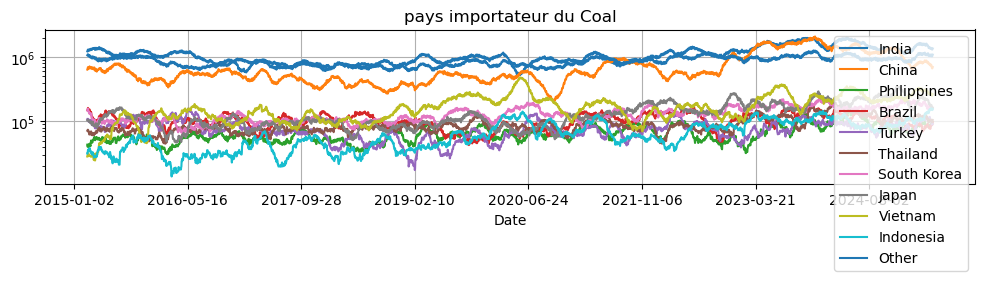

In [43]:
coal_export_df = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_coal export').content
coal_import_df = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_coal import').content

coal_import_df.head(7)


print(coal_import_df.describe().iloc[1].sort_values(ascending=False))

coal_import_df.set_index('Date').rolling(60).mean().plot(figsize=(12,2), grid=True, logy=True, title='pays importateur du Coal')

coal_export_df

Indonesia     1.367806e+06
Australia     6.080113e+05
Other         3.383031e+05
SAFR          2.677595e+05
US            2.676640e+05
Russia        2.445743e+05
China         1.021539e+05
Colombia      1.009883e+05
Mozambique    6.953061e+04
India         6.714100e+04
Canada        4.610642e+04
Name: mean, dtype: float64


<Axes: title={'center': 'pays exportateur du Coal'}, xlabel='Date'>

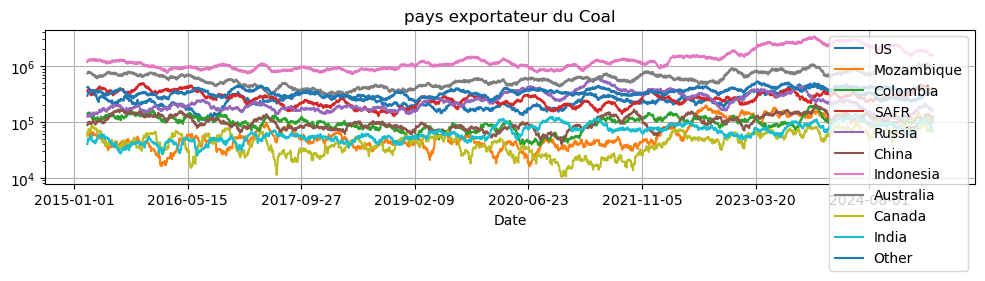

In [44]:
coal_export_df.head(7)
print(coal_export_df.describe().iloc[1].sort_values(ascending=False))
coal_export_df.set_index('Date').rolling(60).mean().plot(figsize=(12,2), grid=True, logy=True, title='pays exportateur du Coal')

In [45]:
# données d'exportations
df_coal_Indonesia_to = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_indonesia_to coal').content
df_coal_Australia_to = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_australia_to coal').content
df_coal_SAFR_to = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_SAFR_to coal').content
df_coal_US_to = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_US_to coal').content
df_coal_Russia_to = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_russia_to coal').content

# données d'importations
df_coal_India_in = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_india_in coal').content
df_coal_China_in = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_china_in coal').content
df_coal_Vietnam_in = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_vietnam_in coal').content
df_coal_Japan_in = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_japan_in coal').content
df_coal_SK_in = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_sk_in coal').content

print(df_coal_Indonesia_to[df_coal_Indonesia_to['Date']==day])
print(df_coal_India_in[df_coal_India_in['Date']==day])

            Date  Bangladesh   India  Philippines   China  Thailand  Taiwan  \
2625  2022-03-11           0  257011        74019  128507         0       0   

      South Korea  Japan  Vietnam  Malaysia  Other  
2625        53458  51402        0      4112      0  
            Date  Mozambique  US  Indonesia  Australia  India  Colombia  \
2626  2022-03-11           0   0     257011     395799  77104         0   

      Singapore  China    SAFR  Russia   Other  
2626          0  20561  156264  205610  224117  


In [46]:
import plotly.graph_objects as go


# Données du jour

#données d'export
day_df_coal_Indonesia_to = df_coal_Indonesia_to[df_coal_Indonesia_to['Date'] == day].iloc[0, 1:]
day_df_coal_Australia_to = df_coal_Australia_to[df_coal_Australia_to['Date'] == day].iloc[0, 1:]
day_df_coal_SAFR_to = df_coal_SAFR_to[df_coal_SAFR_to['Date'] == day].iloc[0, 1:]
day_df_coal_US_to = df_coal_US_to[df_coal_US_to['Date'] == day].iloc[0, 1:]
day_df_coal_Russia_to = df_coal_Russia_to[df_coal_Russia_to['Date'] == day].iloc[0, 1:]


# données d'import
day_df_coal_India_in = df_coal_India_in[df_coal_India_in['Date'] == day].iloc[0, 1:]
day_df_coal_China_in = df_coal_China_in[df_coal_China_in['Date'] == day].iloc[0, 1:]
day_df_coal_Vietnam_in = df_coal_Vietnam_in[df_coal_Vietnam_in['Date'] == day].iloc[0, 1:]
day_df_coal_Japan_in = df_coal_Japan_in[df_coal_Japan_in['Date'] == day].iloc[0, 1:]
day_df_coal_SK_in = df_coal_SK_in[df_coal_SK_in['Date'] == day].iloc[0, 1:]
# Destinations uniques

export_countries= ['Indonesia','Australia','SAFR','US','Russia', 'Other_exp']
import_countries =['India','China','Vietnam','Japan','South Korea', 'Other_imp']


matrix = pandas.DataFrame(0, index=export_countries, columns=import_countries)


# remplissage matrice d'import/export

for country in import_countries:
        if country == 'Other_imp':
            matrix.at['Indonesia', country] = day_df_coal_Indonesia_to.sum()-matrix.loc['Indonesia'].iloc[:-1].sum()
        else:
            matrix.at['Indonesia', country] = day_df_coal_Indonesia_to[country] if country in day_df_coal_Indonesia_to.index else 0
for country in import_countries:
        if country == 'Other_imp':
            matrix.at['Australia', country] = day_df_coal_Australia_to.sum()-matrix.loc['Australia'].iloc[:-1].sum()
        else:
            matrix.at['Australia', country] = day_df_coal_Australia_to[country] if country in day_df_coal_Australia_to.index else 0
for country in import_countries:
        if country == 'Other_imp':
            matrix.at['SAFR', country] = day_df_coal_SAFR_to.sum()-matrix.loc['SAFR'].iloc[:-1].sum()
        else:
            matrix.at['SAFR', country] = day_df_coal_SAFR_to[country] if country in day_df_coal_SAFR_to.index else 0
for country in import_countries:
        if country == 'Other_imp':
            matrix.at['US', country] = day_df_coal_US_to.sum()-matrix.loc['US'].iloc[:-1].sum()
        else:
            matrix.at['US', country] = day_df_coal_US_to[country] if country in day_df_coal_US_to.index else 0
for country in import_countries:
        if country == 'Other_imp':
            matrix.at['Russia', country] = day_df_coal_Russia_to.sum()-matrix.loc['Russia'].iloc[:-1].sum()
        else:
            matrix.at['Russia', country] = day_df_coal_Russia_to[country] if country in day_df_coal_Russia_to.index else 0


print(day_df_coal_India_in)
matrix.at['Other_exp', 'India']= day_df_coal_India_in.sum()-matrix['India'].iloc[:-1].sum()
matrix.at['Other_exp', 'China']= day_df_coal_China_in.sum()-matrix['China'].iloc[:-1].sum()
matrix.at['Other_exp', 'Vietnam']= day_df_coal_Vietnam_in.sum()-matrix['Vietnam'].iloc[:-1].sum()
matrix.at['Other_exp', 'Japan']= day_df_coal_Japan_in.sum()-matrix['Japan'].iloc[:-1].sum()
matrix.at['Other_exp', 'South Korea']= day_df_coal_SK_in.sum()-matrix['South Korea'].iloc[:-1].sum()
print(matrix)

all_targets = sorted(set(day_df_coal_Indonesia_to.index.tolist() + 
                         day_df_coal_Australia_to.index.tolist() + 
                         day_df_coal_SAFR_to.index.tolist()+ 
                         day_df_coal_US_to.index.tolist()+ 
                         day_df_coal_Russia_to.index.tolist()))

# Nœuds
labels = ['Indonesia', 'Australia', 'SAFR', 'US', 'Russia'] + all_targets
label_index = {label: i for i, label in enumerate(labels)}

# Flux
sources, targets, values, colors = [], [], [], []

# Couleurs par source
source_colors = {
    'Indonesia': 'rgba(0, 128, 255, 0.6)',         # bleu
    'Australia': 'rgba(255, 165, 0, 0.6)',    # orange
    'SAFR': 'rgba(50, 205, 50, 0.6)',         # vert
    'US': 'rgba(229, 251, 21, 0.74)',           # jaune
    'Russia': 'rgba(255, 2, 0, 0.74)'       # rouge
}

# Liens depuis Indonesia
for dest, val in day_df_coal_Indonesia_to.items():
    sources.append(label_index['Indonesia'])
    targets.append(label_index[dest])
    values.append(val)
    colors.append(source_colors['Indonesia'])

# Liens depuis Australia
for dest, val in day_df_coal_Australia_to.items():
    sources.append(label_index['Australia'])
    targets.append(label_index[dest])
    values.append(val)
    colors.append(source_colors['Australia'])

# Liens depuis SAFR
for dest, val in day_df_coal_SAFR_to.items():
    sources.append(label_index['SAFR'])
    targets.append(label_index[dest])
    values.append(val)
    colors.append(source_colors['SAFR'])
# Liens depuis US
for dest, val in day_df_coal_US_to.items():
    sources.append(label_index['US'])
    targets.append(label_index[dest])
    values.append(val)
    colors.append(source_colors['US'])

# Liens depuis Russia
for dest, val in day_df_coal_Russia_to.items():
    sources.append(label_index['Russia'])
    targets.append(label_index[dest])
    values.append(val)
    colors.append(source_colors['Russia'])
    
# Création du Sankey
fig = go.Figure(data=[go.Sankey(
    node=dict(label=labels, pad=15, thickness=20),
    link=dict(
        source=sources,
        target=targets,
        value=values,
        color=colors
    )
)])

fig.update_layout(title_text=f"Flux combiné du charbon le {day}", font_size=10)
fig.show()



# diagramme sankey pour la matrice reduite
# Étape 1 : construire les listes source, target, value
sources_2 = []
targets_2 = []
values_2 = []
colors_2 =[]


# Couleurs par source
source_colors_2 = {
    'Indonesia': 'rgba(0, 128, 255, 0.6)',         # bleu
    'Australia': 'rgba(255, 165, 0, 0.6)',    # orange
    'SAFR': 'rgba(50, 205, 50, 0.6)',         # vert
    'US': 'rgba(229, 251, 21, 0.74)',           # jaune
    'Russia': 'rgba(255, 2, 0, 0.74)',
    'Other_exp': 'rgba(245, 40, 145, 0.93)'# rouge# rouge
}
source_labels_2 = list(matrix.index)
target_labels_2 = list(matrix.columns)
all_labels_2 = source_labels_2 + target_labels_2

# dictionnaire pour retrouver les indices pour le diagramme sankey
label_indices_2 = {label: i for i, label in enumerate(all_labels_2)}

for source in source_labels_2:
    for target in target_labels_2:
        value = matrix.loc[source, target]
        if value > 0:
            sources_2.append(label_indices_2[source])
            targets_2.append(label_indices_2[target])
            values_2.append(value)
            colors_2.append(source_colors_2[source])

# Étape 2 : créer le diagramme
fig_2 = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=all_labels_2
    ),
    link=dict(
        source=sources_2,
        target=targets_2,
        value=values_2,
        color=colors_2
    )
)])

fig_2.update_layout(title_text=f"Flux Sankey exportateurs → importateurs ({day})", font_size=10)
fig_2.show()

Mozambique         0
US                 0
Indonesia     257011
Australia     395799
India          77104
Colombia           0
Singapore          0
China          20561
SAFR          156264
Russia        205610
Other         224117
Name: 2626, dtype: object
            India   China  Vietnam  Japan  South Korea  Other_imp
Indonesia  257011  128507        0  51402        53458      78131
Australia  395799       0        0  75047            0          0
SAFR       156264       0        0      0            0      35981
US              0       0        0      0            0     102804
Russia     205610  131590        0      0        96635     621452
Other_exp  321782  247246        0      0        53458          0


In [47]:
## Matrrice d'import/export par jour

In [48]:
test_df = FileContainer.get('all_voyage_orders_by_cargo_type_time_series_stacked_commodity_group').content

test_df.head(7)

,Date,Other minor bulks,Agri,Coal,Minerals,Ferts,Steels,Minor ores & conc,Iron ore,Forestry,Project,MA 90 Days
0,2020-10-19,2649441,3004044,4179730,1558401,1276256,477271,436188,1036630,151818,115095,0.00
1,2020-10-20,2056152,3140192,4214460,1470873,1048918,773578,335831,677054,66760,107329,14388010.50
2,2020-10-21,2883840,3244304,3921659,1196053,876492,700885,677799,908842,94500,38984,14439793.00
3,2020-10-22,1614441,2342947,3626671,1557053,904621,420991,260923,711785,28851,123464,13727781.50
4,2020-10-23,2327728,1548543,3125886,572559,470578,504230,402903,167448,388974,56430,12895281.00
5,2020-10-24,330057,16310,126324,42573,10929,0,0,49478,0,0,10842012.67
6,2020-10-25,103158,23000,37180,45650,34478,29061,13968,0,0,0,9334081.57


In [49]:
coffee_df = FileContainer.get('port_activity_stacked - ANTWERP (coffee)').content

coffee_df.sample(7)

,Date,Waiting/Other,Load,Discharge,Discharge ⇒ Reload,All activities,MA 90 Days
191,2019-07-11,165,40,33,5,243,252.58
281,2019-10-09,175,46,25,9,255,241.97
92,2019-04-03,173,43,29,10,255,244.20
821,2021-04-01,193,39,43,11,286,268.47
1294,2022-07-18,184,41,49,10,284,285.52
961,2021-08-19,202,42,41,4,289,276.58
1080,2021-12-16,192,67,53,7,319,287.51


<Axes: xlabel='Date'>

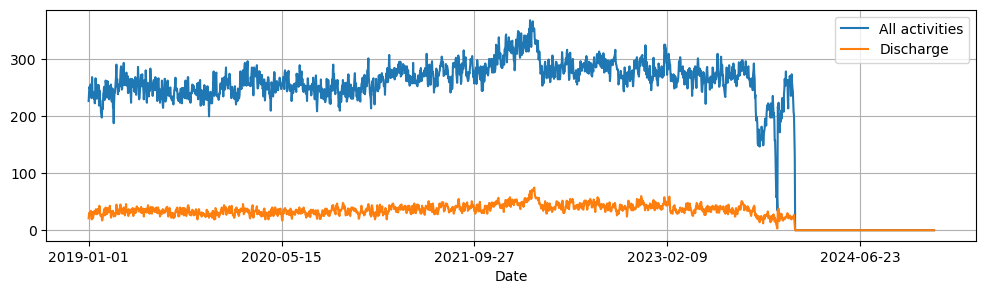

In [50]:
coffee_df.set_index('Date')[['All activities', 'Discharge']].plot(figsize=(12,3), grid=True)

<Axes: xlabel='Date'>

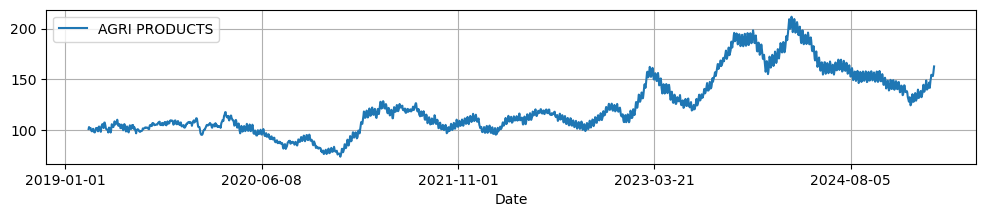

In [51]:
agri_index_df = FileContainer.get('agri_index').content

agri_index_df.set_index('Date').rolling(60).mean().plot(figsize=(12,2), grid=True)

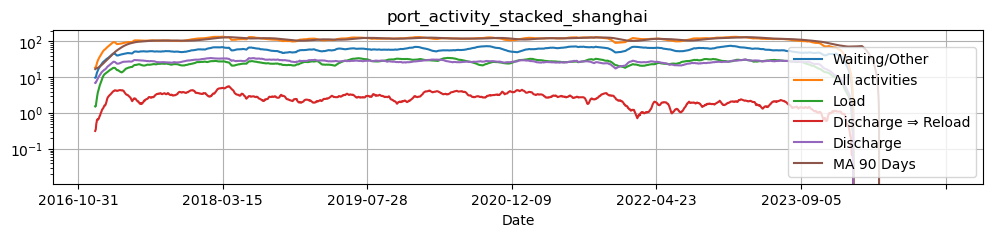

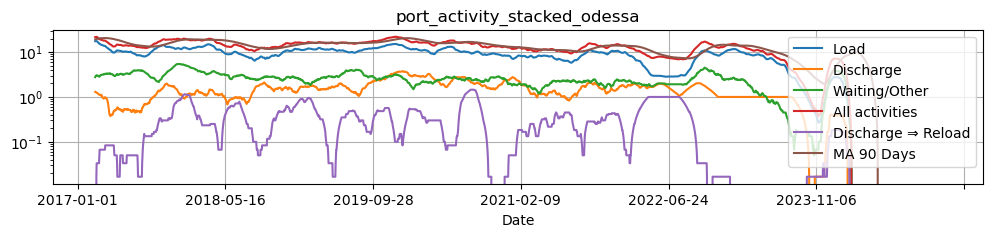

In [52]:
for f in FileContainer2.iterate():
    name = f.name
    if f.shape[0]==0:
        print(f"skipping {name}") 
        continue
    df = f.content
    if 'Date' in df.columns:
        df = df.set_index('Date')
    df.rolling(60).mean().plot(figsize=(12,2), grid=True, logy=True, title=name)

/opt/conda/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:580: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



skipping Data+dictionnary


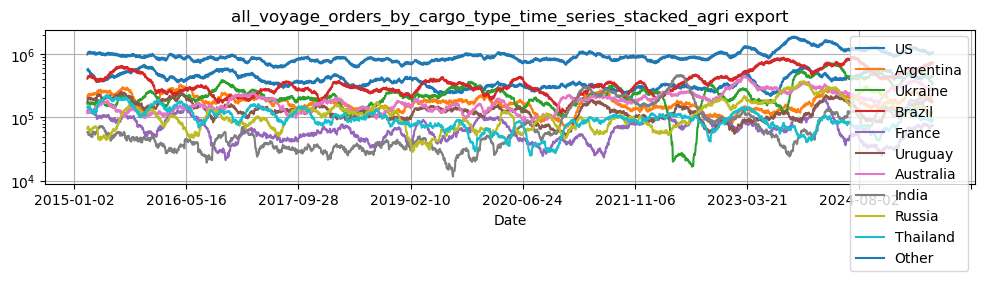

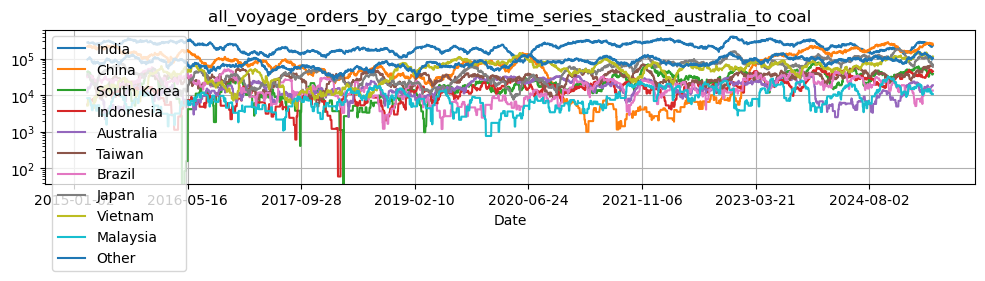

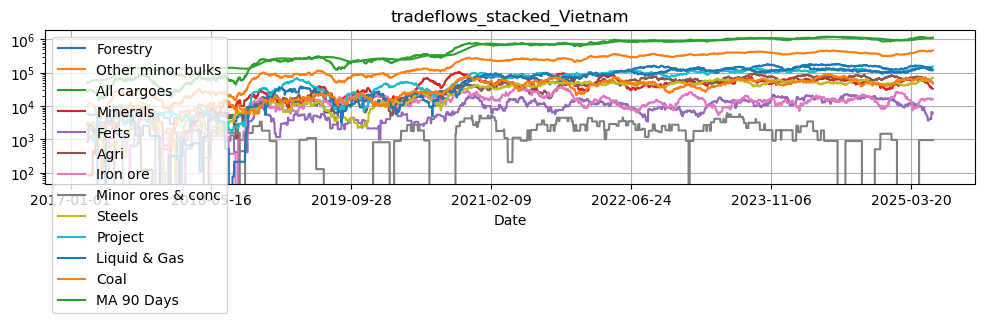

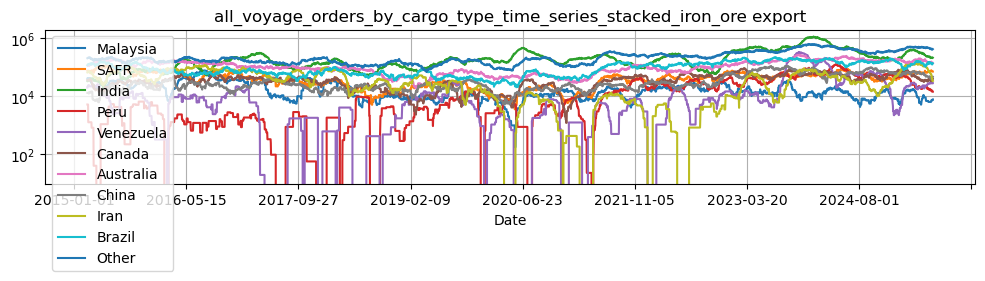

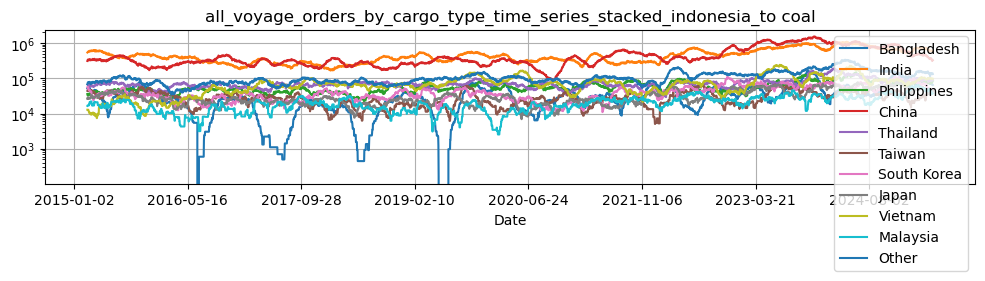

...

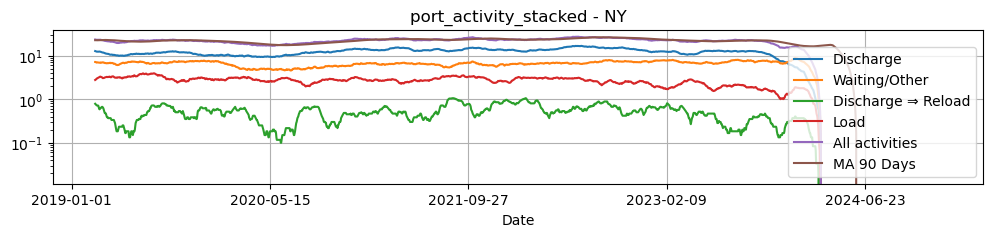

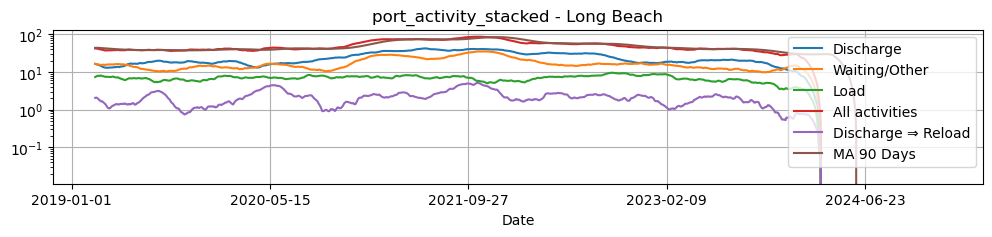

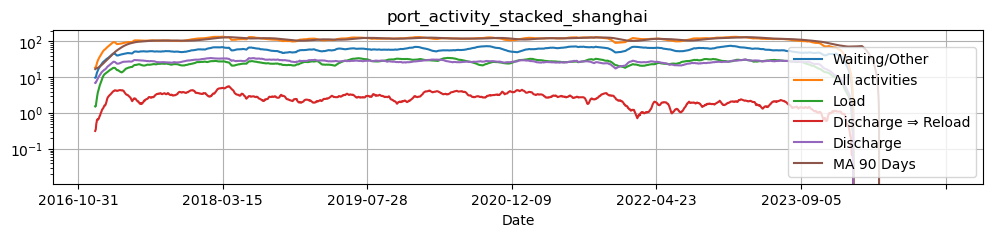

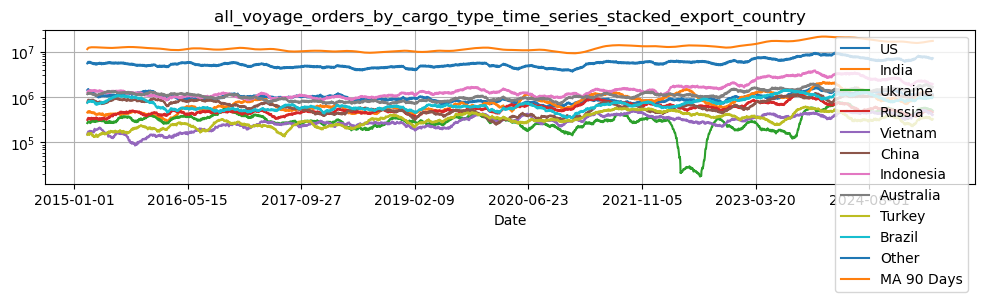

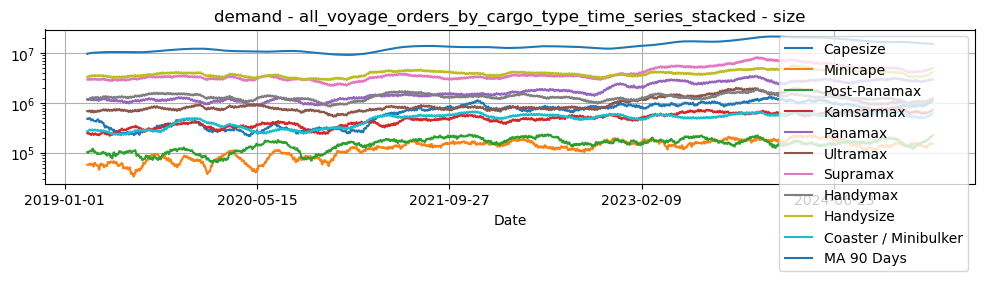

In [53]:
for f in FileContainer.iterate():
    name = f.name
    if f.shape[0]==0:
        print(f"skipping {name}") 
        continue
    df = f.content
    if 'Date' in df.columns:
        df = df.set_index('Date')
    df.rolling(60).mean().plot(figsize=(12,2), grid=True, logy=True, title=name)

# Tar files

In [54]:
f_history = '/home/jovyan/persistent/data/shipfix/history'
glob(f_history + '/*.csv')

[]

In [55]:
history_content_lst = []
for fname in tqdm(glob(f_history + '/*.csv')):
    
    # Replace 'your_file.xlsx' with the path to your Excel file
    df = pandas.read_csv(fname)
    history_content_lst.append(
        FSCC(fname, os.path.basename(fname).split('.')[0], df.shape, df.columns, df)
    )

0it [00:00, ?it/s]

## Daily

In [56]:
f_daily = '/home/jovyan/persistent/data/shipfix/daily'

## Point in time

In [57]:
f_pit = '/home/jovyan/persistent/data/shipfix/point_in_time'